In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image, ImageSequence
from transformers import pipeline

def generate_depth_map_gif(video_path, gif_path, checkpoint="depth-anything/Depth-Anything-V2-base-hf"):
    # 깊이 추정 파이프라인 로드
    pipe = pipeline("depth-estimation", model=checkpoint)

    # 비디오를 프레임으로 분해
    cap = cv2.VideoCapture(video_path)
    fps = int(cap.get(cv2.CAP_PROP_FPS))
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    frames = []
    for _ in tqdm(range(frame_count), desc="Extracting frames"):
        ret, frame = cap.read()
        if not ret:
            break
        frames.append(frame)

    cap.release()

    # 각 프레임에 대해 깊이 맵을 추정
    depth_maps = []
    for i, frame in enumerate(tqdm(frames, desc="Estimating depth maps")):
        image = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        depth_map = pipe(image)
        depth_map = np.array(depth_map['depth'])
        depth_maps.append(depth_map)
        
        # 중간 결과 확인
        if i % 10 == 0:
            plt.figure(figsize=(10, 4))
            plt.subplot(1, 2, 1)
            plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
            plt.title("Original Frame")
            plt.subplot(1, 2, 2)
            plt.imshow(depth_map, cmap='viridis')
            plt.title("Depth Map")
            plt.show()

    # 깊이 맵을 GIF로 변환
    gif_frames = []
    for depth_map in depth_maps:
        depth_map_normalized = cv2.normalize(depth_map, None, 0, 255, cv2.NORM_MINMAX)
        depth_map_uint8 = depth_map_normalized.astype(np.uint8)
        depth_map_colored = cv2.applyColorMap(depth_map_uint8, cv2.COLORMAP_JET)
        depth_map_colored_rgb = cv2.cvtColor(depth_map_colored, cv2.COLOR_BGR2RGB)
        depth_map_pil = Image.fromarray(depth_map_colored_rgb)
        gif_frames.append(depth_map_pil)

    # GIF 저장
    gif_frames[0].save(gif_path, save_all=True, append_images=gif_frames[1:], duration=int(1000/fps), loop=0)
    print(f"Depth map GIF saved at {gif_path}")

    # GIF 재생
    from IPython.display import display, Image as IPImage

    display(IPImage(filename=gif_path))

In [ ]:
# 함수 호출 예제
video_path = 'C:/Users/lkg/Desktop/deer.mp4'
gif_path = 'C:/Users/lkg/Desktop/depth_deer.gif'
generate_depth_map_gif(video_path, gif_path)

In [ ]:
# 함수 호출 예제
video_path = 'C:/Users/lkg/Desktop/car.mp4'
gif_path = 'C:/Users/lkg/Desktop/depth_car.gif'
generate_depth_map_gif(video_path, gif_path)

Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.
Estimating depth maps:   0%|          | 0/52 [00:00<?, ?it/s]

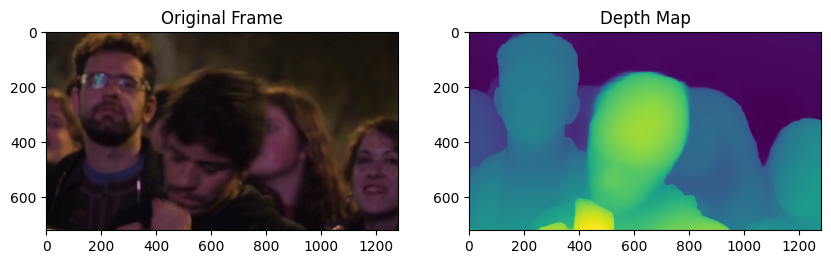

Estimating depth maps:  19%|█▉        | 10/52 [02:10<08:58, 12.81s/it]

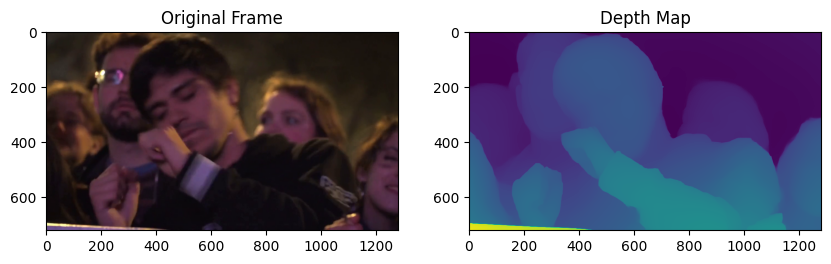

Estimating depth maps:  38%|███▊      | 20/52 [04:20<06:53, 12.93s/it]

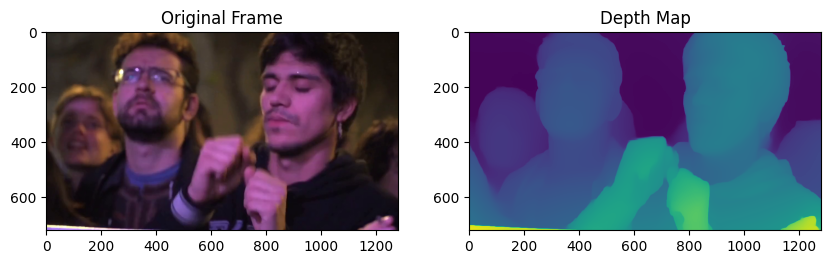

Estimating depth maps:  58%|█████▊    | 30/52 [06:33<04:56, 13.46s/it]

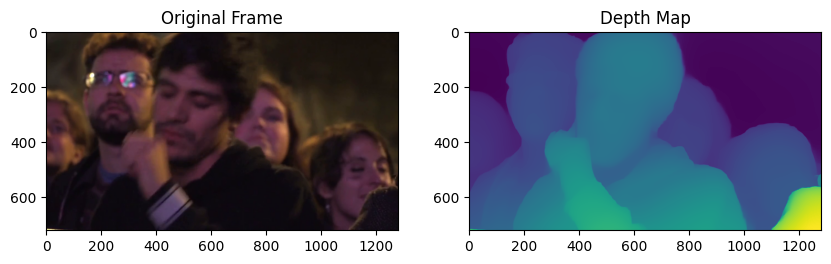

Estimating depth maps:  77%|███████▋  | 40/52 [08:45<02:38, 13.19s/it]

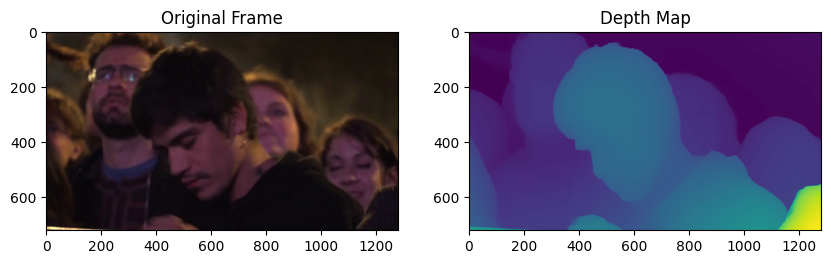

Estimating depth maps:  96%|█████████▌| 50/52 [10:55<00:25, 12.86s/it]

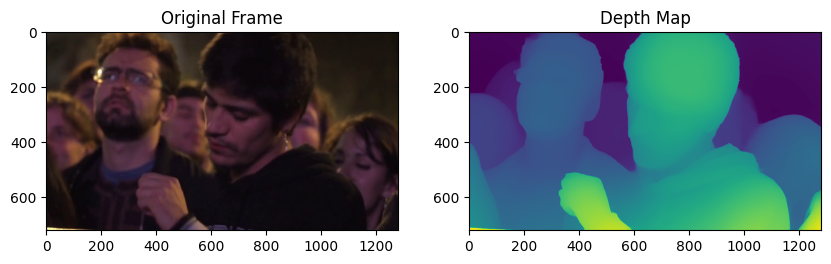

Estimating depth maps: 100%|██████████| 52/52 [11:21<00:00, 13.11s/it]


Depth map GIF saved at C:/Users/lkg/Desktop/depth_cgesture.gif


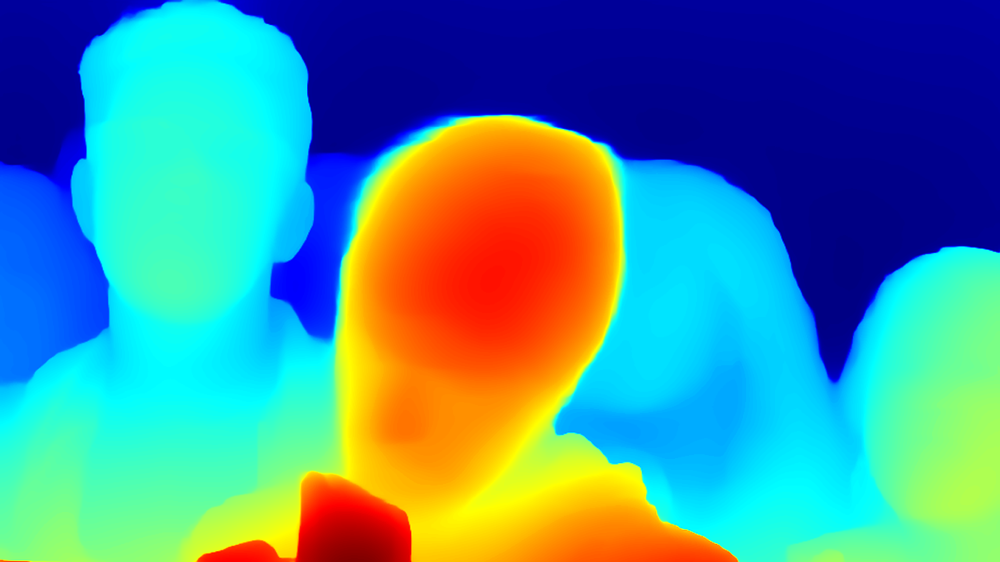

In [7]:
# 함수 호출 예제
video_path = 'C:/Users/lkg/Desktop/gesture.mp4'
gif_path = 'C:/Users/lkg/Desktop/depth_cgesture.gif'
generate_depth_map_gif(video_path, gif_path)